# SEA-AD CaH spatial transcriptomics gene expression

In this notebook, we build on the our [previous investigation](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_spatial_slabs_and_taxonomy.html) into the cell level metadata, combining the metadata gene expressions for select genes that we extract from the released h5ad files.

You need to be connected to the internet to run this notebook and have run through the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html).

In [1]:
from typing import List, Tuple, Optional

import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
from abc_atlas_access.abc_atlas_cache.anndata_utils import get_gene_data

We will interact with the data using the **AbcProjectCache**. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve a up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing the cache if it has not already been.

**Change the download_base variable to where you would like to download the data in your system.**

In [2]:
download_base = Path('../../data/allen-brain-cell-atlas-staging')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base,
    s3_bucket='allen-brain-cell-atlas-staging',
    auth_required=True
)

abc_cache.current_manifest

'releases/20260930/manifest.json'

## Cell metadata

In the [previous tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_spatial_slabs_and_taxonomy.html), we merged the cell metadata tables with their associated specimen metadatadata and then with the spatial coordinates we use to plot the cell locations.

We load the metadata tables we needed and join them in one cell this time.

In [3]:
# Load the human cell metadata and specimen metadata

cell_metadata = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='cell_metadata',
    dtype={"cell_label": str}
).set_index('cell_label')

specimen = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='specimen_metadata'
).set_index('brain_section_label')
donor = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='donor'
).set_index('donor_label')
disease = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='disease'
).set_index('donor_label')

cell_metadata = cell_metadata.join(specimen, on='brain_section_label', rsuffix='_specimen')
cell_metadata = cell_metadata.join(donor, on='donor_label', rsuffix='_donor')
cell_metadata = cell_metadata.join(disease, on='donor_label', rsuffix='_disease')
cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_method,Used in analysis,donor_label,x_experiment,y_experiment,feature_matrix_label,dataset_label,brain_section_barcode_specimen,...,Arteriolosclerosis,LATE,Cognitive Status,Last CASI Score,Interval from last CASI in months,Last MMSE Score,Interval from last MMSE in months,Last MOCA Score,Interval from last MOCA in months,APOE Genotype
cell_label,,,,,,,,,,,,,,,,,,,,,
1417649873_aaabkjfl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2873.683077,19562.403493,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aaadgmad-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3404.344554,18042.061121,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aaalcohl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3807.791820,19874.499081,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aaalgkhn-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2939.943417,20208.759191,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aabcbjaf-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2903.243911,19543.173254,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3


Again, we load and merge the values sets into our data.

In [4]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-10X',
    file_name='value_sets',
).set_index('label')
value_sets

,field,table,color_hex_triplet,order,description,external_identifier
label,,,,,,
2/2,APOE Genotype,disease,#fdd4c2,1,NaN,NaN
2/3,APOE Genotype,disease,#fca082,2,NaN,NaN
2/4,APOE Genotype,disease,#fb6a4a,3,NaN,NaN
3/3,APOE Genotype,disease,#e32f27,4,NaN,NaN
3/4,APOE Genotype,disease,#b21218,5,NaN,NaN
...,...,...,...,...,...,...
FI,region_of_interest_label,library,#008080,7,agranular frontal insular cortex (area FI),DHBA:10329
STG,region_of_interest_label,library,#006400,8,superior temporal gyrus,DHBA:12140
DFC,region_of_interest_label,library,#00008b,9,dorsolateral prefrontal cortex,DHBA:10173


In [5]:
def extract_value_set(cell_metadata_df: pd.DataFrame, input_value_set: pd.DataFrame, input_value_set_label: str):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    cell_metadata_df[f'{input_value_set_label}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['color_hex_triplet'].values
    cell_metadata_df[f'{input_value_set_label}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['order'].values

# Add region of interest color and order
extract_value_set(cell_metadata, value_sets, 'region_of_interest_label')
# Add disease color and order
extract_value_set(cell_metadata, value_sets, 'APOE Genotype')
extract_value_set(cell_metadata, value_sets, 'Arteriolosclerosis')
extract_value_set(cell_metadata, value_sets, 'Atherosclerosis')
extract_value_set(cell_metadata, value_sets, 'Braak')
extract_value_set(cell_metadata, value_sets, 'CERAD score')
extract_value_set(cell_metadata, value_sets, 'Cognitive Status')
extract_value_set(cell_metadata, value_sets, 'LATE')
extract_value_set(cell_metadata, value_sets, 'Highest Lewy Body Disease')
extract_value_set(cell_metadata, value_sets, 'Overall AD neuropathological Change')
extract_value_set(cell_metadata, value_sets, 'Thal')
# Add donor sex/gender color and order
extract_value_set(cell_metadata, value_sets, 'donor_sex')
extract_value_set(cell_metadata, value_sets, 'donor_gender')
# Add race
extract_value_set(cell_metadata, value_sets, 'donor_race')

## Gene expression data

Now we can extract expression for specific genes from the h5ad files and pair it with our gene metadata. In general, we can use the function `get_gene_data` to extract the expression of specific genes for all the cells in a given dataset or a subset of cells.. For more details on using this convenience function, see the [Accessing 10x RNA-seq gene expression data](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html) tutorial notebook.

For this tutorial we will use precomputed tables of the expression for specific genes to compare expression both spatially and by the taxonomy.

In [6]:
genes = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='gene',
).set_index('gene_identifier')
genes.head()

gene.csv: 100%|██████████| 21.5k/21.5k [00:00<00:00, 217kMB/s]


,gene_symbol,feature_types,genome
gene_identifier,,,
ENSG00000175899,A2M,Gene Expression,Unknown
ENSG00000064687,ABCA7,Gene Expression,Unknown
ENSG00000118777,ABCG2,Gene Expression,Unknown
ENSG00000108798,ABI3,Gene Expression,Unknown
ENSG00000230124,ACBD6,Gene Expression,Unknown


We define a set of genes to load via their symbol. We reuse the smaller overlapping subset of genes we used in the previous [10X gene expression notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_10X_snRNASeq_tutorial.html).

In [7]:
gene_names = ['APOE', 'DRD1', 'DRD2', 'AQP4', 'FLT1', 'MME', 'RELN', 'LRP8']

In the cell below, we show how to use the `get_gene_data` function to extract the expression of specific genes from the h5ad metadata. In the commented code, we combine our abc_cache object, cell metadata, gene metadata, and gene symbols we would like select in our `get_gene_data` function that downloads and extracts gene expression data from the h5ad file. Note that this function is an example and should not be used on small systems to extract a large number of genes for all cells at once. For a small subset of cells, it can be used to pull expression data from the h5ad file for all genes. The methods below will pull data from the files normalized with log2cpt, however one can also request the `raw` counts data as well.

For this tutorial we will skip using these functions and instead use a pre-computed gene expression to save time. For specifics on how to use the below functions see [this tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html).

In [8]:
abc_cache.get_file_path('SEA-AD-CaH-Xenium', 'CaH-Xenium/log2', skip_hash_check=True)

CaH-Xenium-log2.h5ad: 100%|██████████| 396M/396M [00:15<00:00, 25.7MMB/s]    


PosixPath('/Users/chris.morrison/src/data/allen-brain-cell-atlas-staging/expression_matrices/SEA-AD-CaH-Xenium/20260930/CaH-Xenium-log2.h5ad')

In [9]:
"""
gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=cell_metadata,
    all_genes=genes,
    selected_genes=gene_names,
    data_type='log2'
)
gene_data
"""

"\ngene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=cell_metadata,\n    all_genes=genes,\n    selected_genes=gene_names,\n    data_type='log2'\n)\ngene_data\n"

In [10]:
gene_data = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='example_gene_expression'
).set_index('cell_label')
gene_data

example_gene_expression.csv: 100%|██████████| 85.9M/85.9M [00:02<00:00, 29.6MMB/s]  


,APOE,AQP4,DRD1,DRD2
cell_label,,,,
1417649873_aaabkjfl-1-20260511,0.000000,0.000000,0.0,0.000000
1417649873_aaadgmad-1-20260511,0.000000,0.000000,0.0,0.000000
1417649873_aaalcohl-1-20260511,0.000000,0.000000,0.0,0.000000
1417649873_aaalgkhn-1-20260511,0.000000,0.000000,0.0,0.000000
1417649873_aabcbjaf-1-20260511,0.000000,0.000000,0.0,0.000000
...,...,...,...,...
1417648792_oimmgmfp-1-20260511,0.000000,3.149587,0.0,0.000000
1417648792_oimnaldj-1-20260511,0.000000,5.385994,0.0,0.000000
1417648792_oimnfejb-1-20260511,3.990375,4.477457,0.0,2.393778


We load the precomputed gene expressions for each species below instead of running the processing. Note that the Human and Marmoset data contain all 4 of the genes we requested, however AQP4 is not in the Macaque data.

Now that we've loaded our expression matrix tables, indexed by cell_label, we can merge them into our cell metadata tables.

In [12]:
cell_metadata_with_genes = cell_metadata.join(gene_data, on='cell_label')
cell_metadata_with_genes = cell_metadata_with_genes[cell_metadata_with_genes['Used in analysis']]

# clean up memory
del gene_data

### Plotting the Sections

We define a helper function *plot_sections* to visualize the cells for a specified set of brain sections either by colorized metadata or gene expression. This function can be used to plot individual brain sections as well.

In [13]:
def plot_sections(
    df: pd.DataFrame,
    feature: str,
    section_list: List[str],
    cmap: Optional[plt.Colormap] = None,
    vmin: Optional[float] = None,
    vmax: Optional[float] = None,
    fig_width: float = 40,
    fig_height: float = 8,
    point_size: float = 1.0,
    unit: str = '[log2(CPT + 1)]',
    fix_bounds: bool = False
) -> Tuple[plt.Figure, np.ndarray]:
    """Plot spatial transcriptomics data.

    Parameters
    ----------
    df: pandas.DataFrame
        cell metadata data frame with x,y locations to plot.
    feature: str
        Expression value or color column to plot.
    section_list: List[str]
        List of brain section ids to plot.
    cmap: matplotlib.colors.Colormap
        Colormap for expression features.
    vmin: float
        Minimum value for color mapping. Defaults to min of values in the feature column. Values lower than
        this will be plotted as grey. 
    vmax: float
        Maximum value for color mapping. Defaults to max of values in the feature column. Values higher than
        this will be plotted as grey.
    fig_width: int
        Width of the plotted figure.
    fig_height: int
        Height of the plotted figure.
    point_size: float
        Size of the points to plot.
    fix_bounds: bool
        If True, fix the x and y bounds across all sections to be the same values.
    """
    if isinstance(section_list, str):
        section_list = [section_list]
    
    fig, ax = plt.subplots(1, len(section_list))
    fig.set_size_inches(fig_width, fig_height)

    if len(section_list) == 1:
        ax = [ax]

    if 'x' in df.columns:
        x_col = 'x'
    elif 'x_experiment' in df.columns:
        x_col = 'x_experiment'
    if 'y' in df.columns:
        y_col = 'y'
    elif 'y_experiment' in df.columns:
        y_col = 'y_experiment'

    if fix_bounds:
        x_min = df[x_col].min()
        x_max = df[x_col].max()
        y_min = df[y_col].min()
        y_max = df[y_col].max()

    vv = df[feature]
    if vmin is None:
        vmin = vv.min()

    if vmax is None:
        vmax = vv.max()

    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cmap = sm.get_cmap()
    
    for idx, section in enumerate(section_list):

        if 'slab_plane_label' in df.columns:
            filtered = df[df['slab_plane_label'] == section]
        elif 'brain_section_label' in df.columns:
            filtered = df[df['brain_section_label'] == section]
        
        xx = filtered[x_col]
        yy = filtered[y_col]
        vv = filtered[feature]

        if cmap is not None:
            mask = np.logical_and(vv >= vmin, vv <= vmax)
            if mask.any():
                ax[idx].scatter(xx[~mask], yy[~mask], s=1.0, c='#D3D3D3', marker='.')
                ax[idx].scatter(xx[mask], yy[mask], s=1.0, c=vv[mask], marker='.', cmap=cmap)
            else :
                ax[idx].scatter(xx, yy, s=1.0, color=vv, marker=".")
        else :
            ax[idx].scatter(xx, yy, s=point_size, c=vv, marker=".")
            
        ax[idx].axis('equal')
        ylim = ax[idx].get_ylim()
        if fix_bounds:
            ylim = (y_min, y_max)
            ax[idx].set_xlim(x_min, x_max)
        ax[idx].set_ylim(ylim[1], ylim[0])
        ax[idx].set_xticks([])
        ax[idx].set_yticks([])
        
        ax[idx].set_title(section)
        ax[idx].legend(loc=0, markerscale=10)


    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.01, pad=0.01)
    cbar.set_label(unit)

    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    return fig, ax

Below we plot the spatial expression of our gene across the different sections. We select a minium expression value of which effectively masks out zero expression cells from the plots, showing a bit more contrast. Feel free to experiment with different vmin and vmax values in investigate the gene expressions more in depth.

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with label

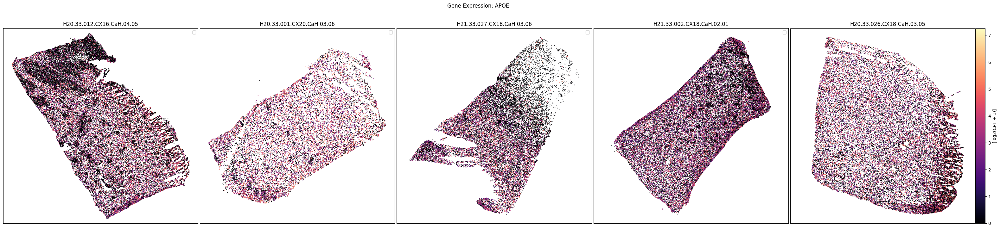

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with label

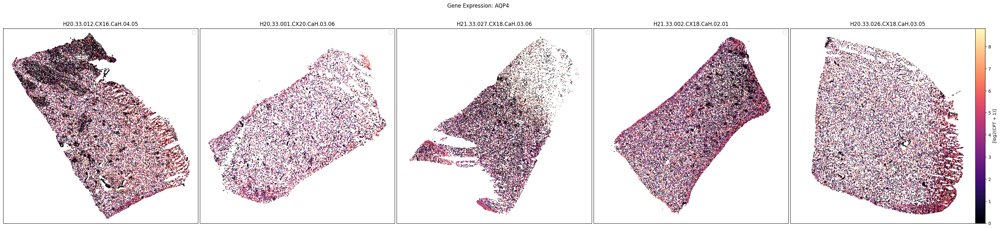

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with label

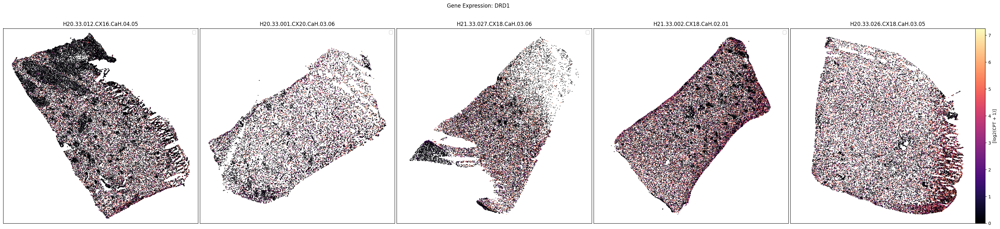

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0, markerscale=10)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_31032/1768468827.py:107: UserWarning: No artists with label

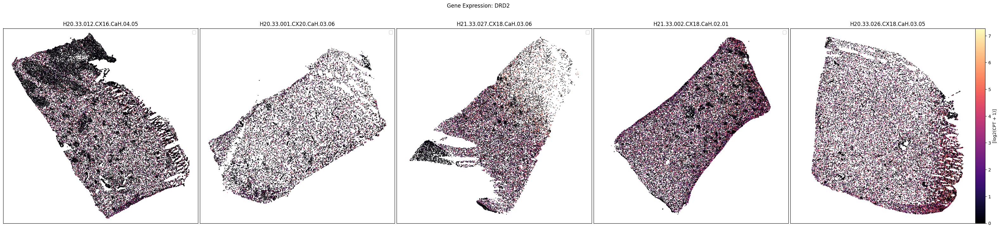

In [14]:
gene_names = cell_metadata_with_genes.columns[
    cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
section_list = [
    'H20.33.012.CX16.CaH.04.05', 'H20.33.001.CX20.CaH.03.06',
    'H21.33.027.CX18.CaH.03.06', 'H21.33.002.CX18.CaH.02.01',
    'H20.33.026.CX18.CaH.03.05'
]
for gene_symbol in gene_names:
    fig, ax = plot_sections(
        cell_metadata_with_genes,
        gene_symbol,
        section_list,
        cmap=plt.cm.magma,
        vmin=None,
        vmax=None,
    )
    fig.suptitle(f'Gene Expression: {gene_symbol}')
    plt.show()

### Plotting heatmap expression data.

We define a helper functions *aggregate_by_metadata* to compute the average expression for a given category. Note that this is a simple wrapper of the Pandas GroupBy functionality. Other summary statistics beyond just the `mean` are listed here: https://pandas.pydata.org/docs/reference/groupby.html#dataframegroupby-computations-descriptive-stats

We also define a function to plot the resultant averaged data in a heatmap.

In [15]:
def aggregate_by_metadata(df: pd.DataFrame, gnames: List[str], value: str, sort: bool = False) -> pd.DataFrame:
    """Aggregate gene expression data by metadata.

    Parameters
    ----------
    df: pandas.DataFrame
        DataFrame containing gene expression and metadata.
    gnames: List[str]
        List of gene names to aggregate.
    value: str
    sort: bool
        Metadata column to group by.
        If True, sort the output by the first gene in gnames.

    Returns
    -------
    pandas.DataFrame
        DataFrame with aggregated gene expression values.
    """
    grouped = df.groupby(value)[gnames].mean()
    if sort:
        grouped = grouped.sort_values(by=gnames[0], ascending=False)
    return grouped


def plot_heatmap(
        df: pd.DataFrame,
        fig_width: int = 8,
        fig_height: int = 4,
        cmap: mpl.colormaps = plt.cm.magma,
        vmax: Optional[float] = None,
        unit: str = '[log2(CPT + 1)]'
    ) -> Tuple[plt.Figure, plt.Axes]:
    """Plot a heatmap from a DataFrame.

    Parameters
    ----------
    df: pandas.DataFrame
        DataFrame to plot as a heatmap.
    fig_width: int
        Width of the figure.
    fig_height: int
        Height of the figure.
    cmap: matplotlib.colors.Colormap
        Colormap to use for the heatmap.

    Returns
    -------
    fig: matplotlib.pyplot.Figure
        Figure object containing the heatmap.
    ax: matplotlib.pyplot.Axes
        Axes object containing the heatmap.
    """

    arr = df.to_numpy().astype('float')

    vmin = arr.min()
    vmax = arr.max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cmap = sm.get_cmap()

    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    ax.imshow(arr, cmap=cmap, aspect='auto')
    xlabs = df.columns.values
    ylabs = df.index.values

    ax.set_xticks(range(len(xlabs)))
    ax.set_xticklabels(xlabs)

    ax.set_yticks(range(len(ylabs)))
    ax.set_yticklabels(ylabs)

    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.1, pad=0.01)
    cbar.set_label(unit)

    return fig, ax

## Taxonomy mapping

Finally, let's load the taxonomy information so that we can plot gene expression versus various taxons in a heatmap for each species. Below, we load and merge all the information we need to plot cell colors and taxonomy as done in previous [SEA-AD CaH tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_clustering_analysis_and_annotation.html).

In [16]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe(
    'SEA-AD-CaH-Xenium', 'mmc_results'
).set_index('cell_label')
cluster = abc_cache.get_metadata_dataframe(
    'SEA-AD-CaH-taxonomy', 'cluster'
).set_index('label')
cluster_annotation_term = abc_cache.get_metadata_dataframe(
    'SEA-AD-CaH-taxonomy', 'cluster_annotation_term'
).set_index('label')

cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_annotation_term_set'
).set_index('label')

cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')

membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)

membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()

membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)

cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_order = membership_groupby['term_order'].first().unstack()

cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]

cell_metadata_with_genes = cell_metadata_with_genes.join(cell_to_cluster_membership, how='inner')
cell_metadata_with_genes = cell_metadata_with_genes.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_metadata_with_genes = cell_metadata_with_genes.join(cluster_order, on='cluster_alias', rsuffix='_order')
cell_metadata_with_genes.head()

,brain_section_label,brain_section_barcode,segmentation_method,Used in analysis,donor_label,x_experiment,y_experiment,feature_matrix_label,dataset_label,brain_section_barcode_specimen,...,Neighborhood_conf,Subclass_conf,Supertype_conf,cluster_alias,Neighborhood_color,Subclass_color,Supertype_color,Neighborhood_order,Subclass_order,Supertype_order
cell_label,,,,,,,,,,,,,,,,,,,,,
1417642742_acceihdg-1-20260511,H20.33.001.CX20.CaH.03.06,1417642742,Segmented by interior stain (18S),True,H20.33.001,10099.332491,11544.492188,CaH-Xenium,SEA-AD-CaH-Xenium,1417642742,...,1.000000,1.0,0.807320,44,#6BBC6B,#94AF97,#A8CCA8,5,11,44
1417642742_acciallc-1-20260511,H20.33.001.CX20.CaH.03.06,1417642742,Segmented by interior stain (18S),True,H20.33.001,10187.203585,11727.213925,CaH-Xenium,SEA-AD-CaH-Xenium,1417642742,...,0.999927,1.0,0.767159,36,#9A7345,#665C47,#B2AA9C,4,9,36
1417642742_accpdopd-1-20260511,H20.33.001.CX20.CaH.03.06,1417642742,Segmented by interior stain (18S),True,H20.33.001,10187.956112,11624.917279,CaH-Xenium,SEA-AD-CaH-Xenium,1417642742,...,0.642588,1.0,0.982947,58,#459A8C,#53776C,#4B5F58,6,13,58
1417642742_acdaemfn-1-20260511,H20.33.001.CX20.CaH.03.06,1417642742,Segmented by interior stain (18S),True,H20.33.001,10135.970818,11713.781020,CaH-Xenium,SEA-AD-CaH-Xenium,1417642742,...,0.999362,1.0,0.991184,58,#459A8C,#53776C,#4B5F58,6,13,58
1417642742_acdbmebk-1-20260511,H20.33.001.CX20.CaH.03.06,1417642742,Segmented by interior stain (18S),True,H20.33.001,10125.627298,11551.670496,CaH-Xenium,SEA-AD-CaH-Xenium,1417642742,...,1.000000,1.0,0.752024,44,#6BBC6B,#94AF97,#A8CCA8,5,11,44


### Visualize gene expression for selected genes by the SEA-AD Caudate taxonomy.

Below we average the expression of our selected genes across taxons from the SEA-AD Caudate taxonomy. We show the expression for taxons at the class level for each species. See the heatmaps for each in [SEA-AD CaH 10X gene expression tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_10X_snRNASeq_tutorial.html) for more examples with a larger gene panel.

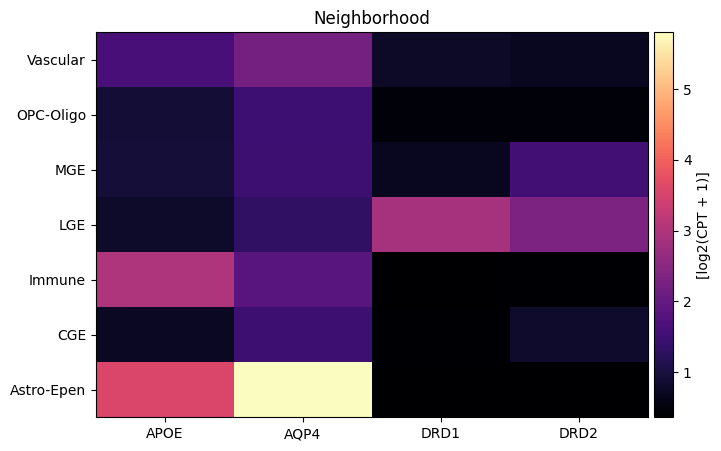

In [17]:
gene_names = cell_metadata_with_genes.columns[
    cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(cell_metadata_with_genes, gene_names, 'Neighborhood')
agg = agg.loc[list(reversed(list(agg.index)))]
plot_heatmap(agg, 8, 5, vmax=15)
plt.title('Neighborhood')
plt.show()

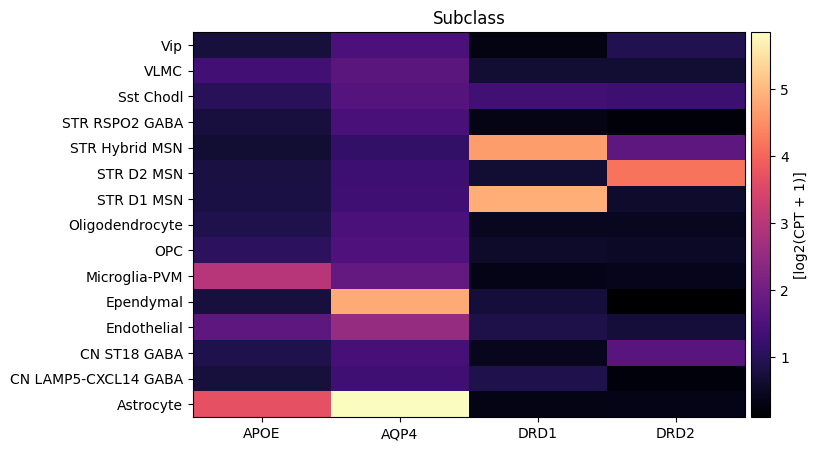

In [18]:
gene_names = cell_metadata_with_genes.columns[
    cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(cell_metadata_with_genes, gene_names, 'Subclass')
agg = agg.loc[list(reversed(list(agg.index)))]
plot_heatmap(agg, 8, 5, vmax=15)
plt.title('Subclass')
plt.show()

To learn more about the spatial data see the [SEA-AD CaH Spatial Sections and Taxonomy notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_spatial_sections_and_taxonomy.html).

To learn more about the taxonomy used in this notebook and the data it is derived from, see the [SEA-AD CaH Clustering Analysis and Taxonomy notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_clustering_analysis_and_annotation.html).